<a href="https://colab.research.google.com/github/YounSooKimTech/Joy_Profile_Photos/blob/main/Cornell_University_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Meta Dataset

In [ ]:
import pandas as pd
import requests
from bs4 import BeautifulSoup

df_names =[]
df_urls = []
df_schools = []
df_departments = []

departments = ["accounting", "finance", "management-and-organizations", "marketing", "operations-technology-information-management", "economics"]

for department in departments:
  url = f"https://www.johnson.cornell.edu/programs/phd-program/{department}/"
  response = requests.get(url)
  soup = BeautifulSoup(response.content, 'html.parser')
  #print(url, response)

  sub_divs = soup.find_all("div", class_="g-col t-content site-panel--wysiwyg__col")

  for sub_div in sub_divs:
      p_tags = sub_div.find_all("a")
      for p_tag in p_tags:
          name = p_tag.get_text()
          href = p_tag["href"]
          school = p_tag.find_next('br').next_sibling.strip()

          #print(name, school)
          df_names.append(name)
          df_urls.append(href)
          df_schools.append(school)
          df_departments.append(department)

In [ ]:
df_1 = pd.DataFrame({"Name":df_names,
                     "School":df_schools,
                     "Department":df_departments,
                     "URL":df_urls})

df_1.head(3)

df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Name        110 non-null    object
 1   School      110 non-null    object
 2   Department  110 non-null    object
 3   URL         110 non-null    object
dtypes: object(4)
memory usage: 3.6+ KB


## Filter the dataset based on School

In [ ]:
df_1_J = df_1[df_1["School"].str.contains("Johnson")]
df_1_J["Name"] = df_1_J["Name"].str.strip()

df_1_J.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 108
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Name        58 non-null     object
 1   School      58 non-null     object
 2   Department  58 non-null     object
 3   URL         58 non-null     object
dtypes: object(4)
memory usage: 2.3+ KB


<ipython-input-21-48498062a337>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1_J["Name"] = df_1_J["Name"].str.strip()


In [ ]:
df_titles = []

for index, row in df_1_J.iterrows():
    name = row["Name"]
    url = row["URL"]
    response = requests.get(url)
    #print(name, url, response)
    soup = BeautifulSoup(response.content, 'html.parser')
    title = soup.find("ul", class_="faculty-profile__list")
    title = title.get_text().strip() if title else None

    df_titles.append(title)
    #print(name, ":", title, "\n")

df_1_J["Title"] = df_titles

<ipython-input-22-ca941cd0a4dd>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1_J["Title"] = df_titles


In [ ]:
df_1_J = df_1_J[df_1_J["Name"] != "Lawrence W. Robinson"] #No page exist

df_1_J["School"].value_counts()

Johnson School    54
Johnson            3
Name: School, dtype: int64

## Rank

In [ ]:
import numpy as np

conditions = [
    df_1_J["Title"].str.contains("Emeritus"),
    df_1_J["Title"].str.contains("Emerita"),
    df_1_J["Title"].str.contains("Assistant"),
    df_1_J["Title"].str.contains("Associate")
]

choices = ["Emeritus", "Emeritus", "Assistant", "Associate"]

df_1_J["Rank"] = np.select(conditions, choices, default="Full")

df_1_J["Rank"].value_counts()

<ipython-input-24-732a2998eda2>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1_J["Rank"] = np.select(conditions, choices, default="Full")


Full         29
Assistant    19
Associate     9
Name: Rank, dtype: int64

## Gender based on Biography

In [ ]:
df_bios = []

for index, row in df_1_J.iterrows():
    name = row["Name"]
    url = row["URL"]
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')
    p_tag = soup.find("p", class_="faculty-profile__bio")
    bio = p_tag.get_text().strip() if p_tag else None

    df_bios.append(bio)

    #print(name, bio, "\n")

df_1_J["Biography"] = df_bios

In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')

pronouns_list = []

for text in df_1_J['Biography']:
    if text == None:
      text = ""
    doc = nlp(text)
    pronouns = set(token.text.lower() for token in doc if token.pos_ == 'PRON' and token.text.lower() in ['he', 'she', 'her', 'his'])
    pronouns = list(pronouns)
    pronouns_list.append(pronouns)

df_1_J['Pronouns'] = pronouns_list

def determine_sex(pronouns):
    if 'he' in pronouns or 'his' in pronouns:
        return 'Male'
    elif 'she' in pronouns or 'her' in pronouns:
        return 'Female'
    else:
        return 'Unknown'

df_1_J['Sex'] = df_1_J['Pronouns'].apply(determine_sex)

In [ ]:
df_1_J["Pronouns"].value_counts().reset_index()

,index,Pronouns
0,"[his, he]",36
1,"[her, she]",11
2,[],5
3,[he],4
4,[his],1


### No Biography information case handlings


In [ ]:
df_1_J[df_1_J["Sex"] == "Unknown"]

,Name,School,Department,URL,Title,Rank,Biography,Pronouns,Sex
46,Elizabeth McClean,Johnson School,management-and-organizations,https://www.johnson.cornell.edu/faculty-resear...,Associate Professor,Associate,None,[],Unknown
73,Omid Rafieian,Johnson School,marketing,https://www.johnson.cornell.edu/faculty-resear...,Assistant Professor\nDemir Sabanci Faculty Fel...,Assistant,None,[],Unknown
89,Yichun Hu,Johnson School,operations-technology-information-management,https://business.cornell.edu/faculty-research/...,Assistant Professor,Assistant,None,[],Unknown
90,Nur Kaynar,Johnson School,operations-technology-information-management,https://www.johnson.cornell.edu/faculty-resear...,Assistant Professor,Assistant,None,[],Unknown
97,Adam Dearing,Johnson School,economics,https://www.johnson.cornell.edu/faculty-resear...,Assistant Professor,Assistant,None,[],Unknown


In [ ]:
# https://kjzz.org/content/1685853/pitching-idea-work-university-arizona-study-says-go-against-gender-stereotypes
# https://tech.cornell.edu/people/omid-rafieian/
# https://business.cornell.edu/hub/2023/07/17/meet-our-new-faculty-yichun-hu/
# https://www.cornell.edu/video/nur-kaynar-financial-incentives-worker-productivity-online-labor-platforms


df_1_J.loc[df_1_J["Name"] =="Elizabeth McClean", "Sex"] = "Female"
df_1_J.loc[df_1_J["Name"] =="Omid Rafieian", "Sex"] = "Male"
df_1_J.loc[df_1_J["Name"] =="Yichun Hu", "Sex"] = "Female"
df_1_J.loc[df_1_J["Name"] =="Nur Kaynar", "Sex"] = "Female"


In [ ]:
df_1_J[df_1_J["Sex"] == "Unknown"]

,Name,School,Department,URL,Title,Rank,Biography,Pronouns,Sex
97,Adam Dearing,Johnson School,economics,https://www.johnson.cornell.edu/faculty-resear...,Assistant Professor,Assistant,None,[],Unknown


In [ ]:
df_2_J = df_1_J[df_1_J["Sex"] != "Unknown"]

In [ ]:
df_2_J.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56 entries, 0 to 108
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Name        56 non-null     object
 1   School      56 non-null     object
 2   Department  56 non-null     object
 3   URL         56 non-null     object
 4   Title       56 non-null     object
 5   Rank        56 non-null     object
 6   Biography   52 non-null     object
 7   Pronouns    56 non-null     object
 8   Sex         56 non-null     object
dtypes: object(9)
memory usage: 4.4+ KB


# Photo scrap

In [ ]:
from google.colab import files
import requests
from bs4 import BeautifulSoup

filenames_d = []

for index, row in df_2_J.iterrows():
    name = row["Name"]
    new_name = name.lower().replace(".", "").replace(" ", "_")
    filename = f"{new_name}.jpg"
    filenames_d.append(filename)

    url = row["URL"]
    response = requests.get(url)
    #print(name, new_name, response)
    soup = BeautifulSoup(response.content, 'html.parser')

    div_tag = soup.find("div", class_="faculty-profile t-content")
    img_tag = div_tag.find("img")
    img_src = img_tag["src"]

    #print(name, img_src)

    flag = requests.get(img_src)

    with open(filename, "wb") as f:
        noop = f.write(flag.content)
        print(f"{name} saved the {filename}")

        #files.download(filename)
        #print(f"download the {filename}")


Sanjeev Bhojraj saved the sanjeev_bhojraj.jpg
Robert J. Bloomfield saved the robert_j_bloomfield.jpg
Nicholas Matthew Guest saved the nicholas_matthew_guest.jpg
Ryan Guggenmos saved the ryan_guggenmos.jpg
Robert Libby saved the robert_libby.jpg
Yao Lu saved the yao_lu.jpg
Mark W. Nelson saved the mark_w_nelson.jpg
Kristina Marie Rennekamp saved the kristina_marie_rennekamp.jpg
Mani Sethuraman saved the mani_sethuraman.jpg
P. Eric Yeung saved the p_eric_yeung.jpg
Xinyu Zhang saved the xinyu_zhang.jpg
Warren B. Bailey saved the warren_b_bailey.jpg
Matthew Baron saved the matthew_baron.jpg
Murillo Campello saved the murillo_campello.jpg
Will Cong saved the will_cong.jpg
Adrian Aycan Corum saved the adrian_aycan_corum.jpg
Ming Huang saved the ming_huang.jpg
Robert A. Jarrow saved the robert_a_jarrow.jpg
Andrew Karolyi saved the andrew_karolyi.jpg
Maureen O’Hara saved the maureen_o’hara.jpg
Gideon Saar saved the gideon_saar.jpg
Gautam Ahuja saved the gautam_ahuja.jpg
Ya-Ru Chen saved the ya

In [ ]:
# Save the file as a zipfile
import zipfile
import os

zip_filename = '2024_cornell_images.zip'

with zipfile.ZipFile(zip_filename, 'w') as zipf:
  for filename in filenames_d:
    #print(filename)
    zipf.write(filename)

from google.colab import files
files.download('/content/2024_cornell_images.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Smile Detection

Sanjeev Bhojraj


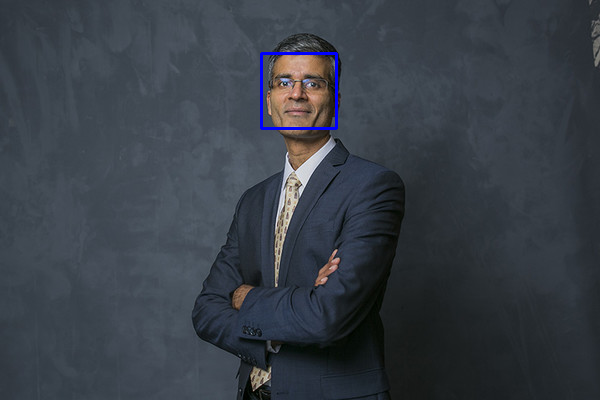

Robert J. Bloomfield


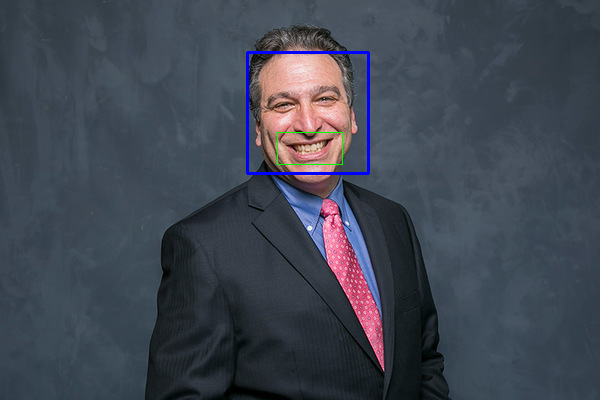

Nicholas Matthew Guest


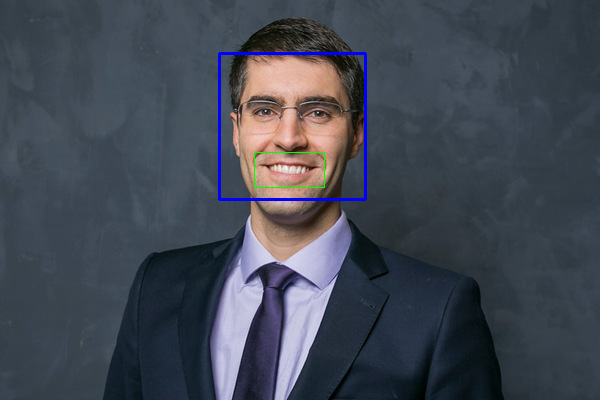

Ryan Guggenmos


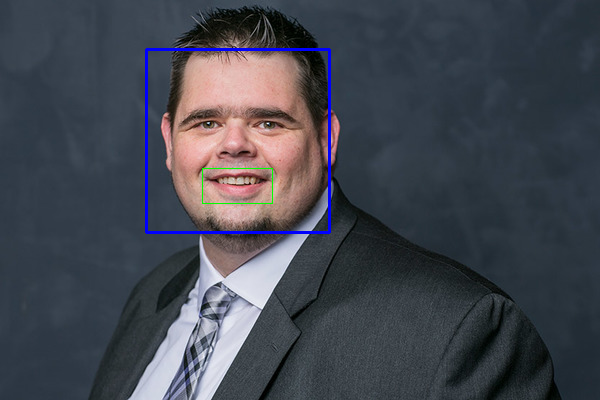

Robert Libby


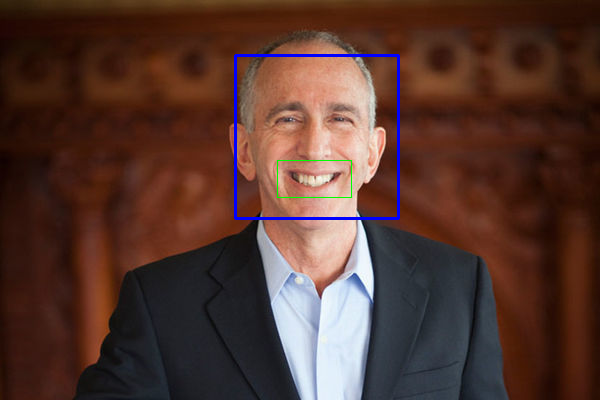

Yao Lu


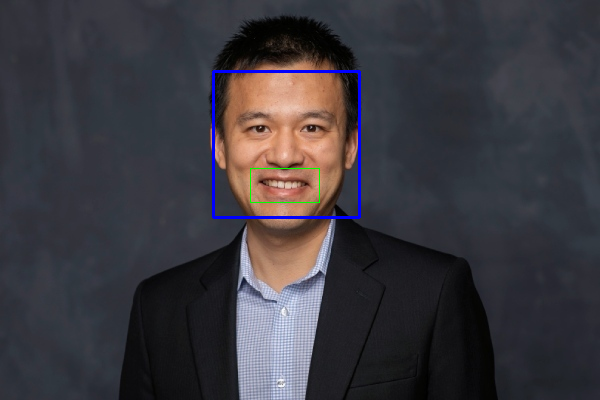

Mark W. Nelson


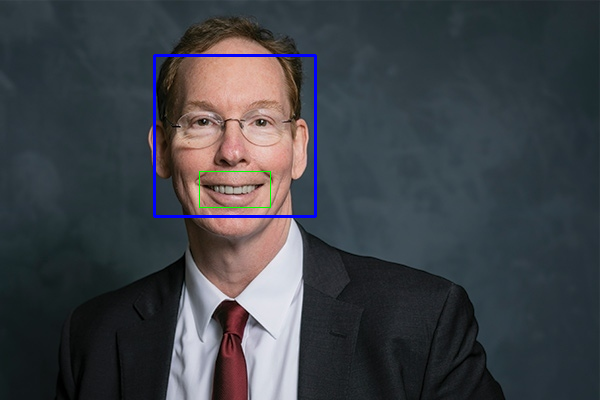

Kristina Marie Rennekamp


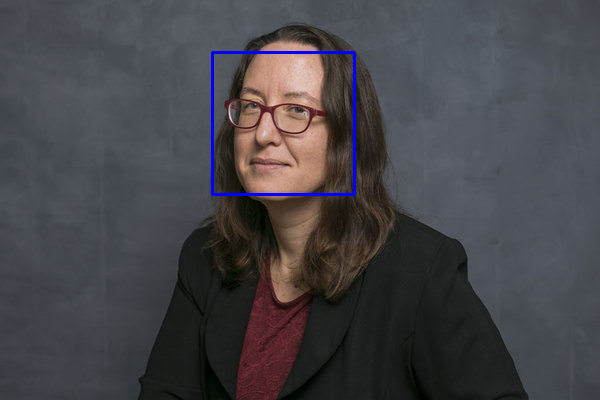

Mani Sethuraman


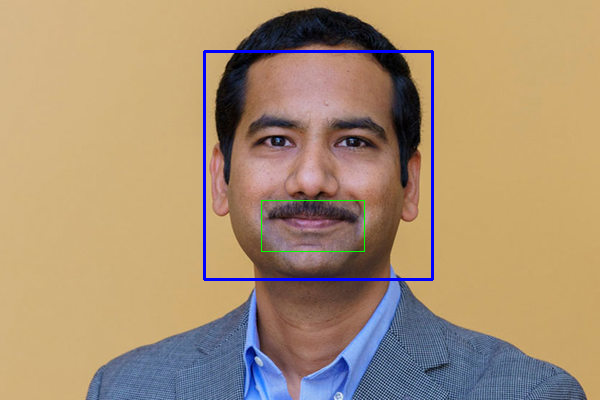

P. Eric Yeung


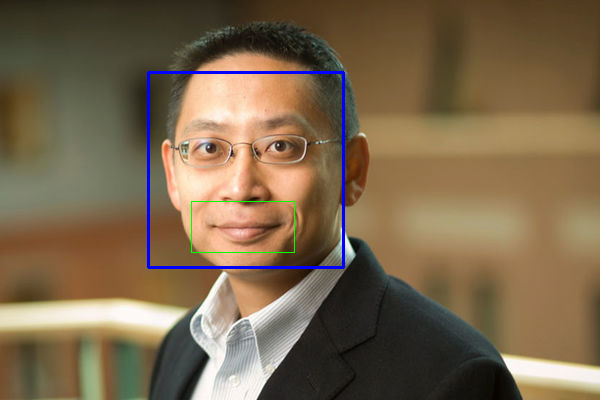

Xinyu Zhang


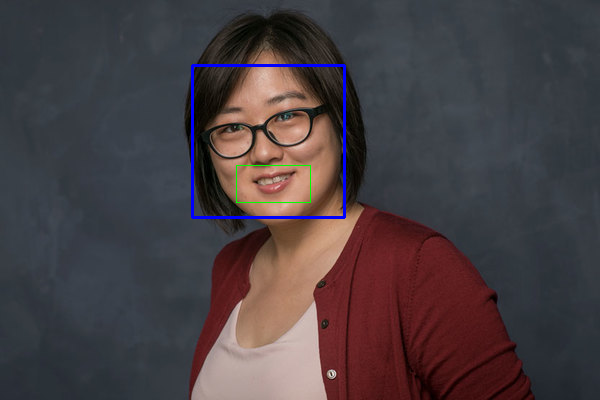

Warren B. Bailey


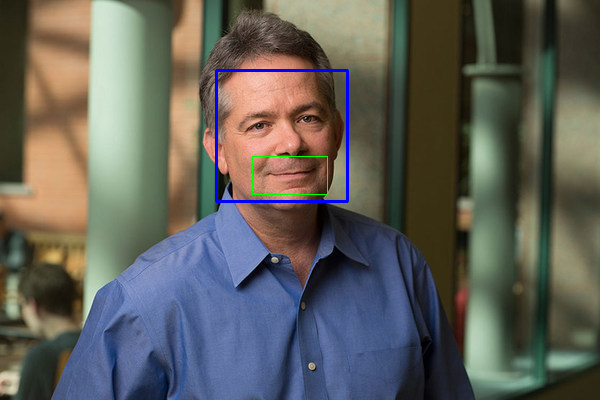

Matthew Baron


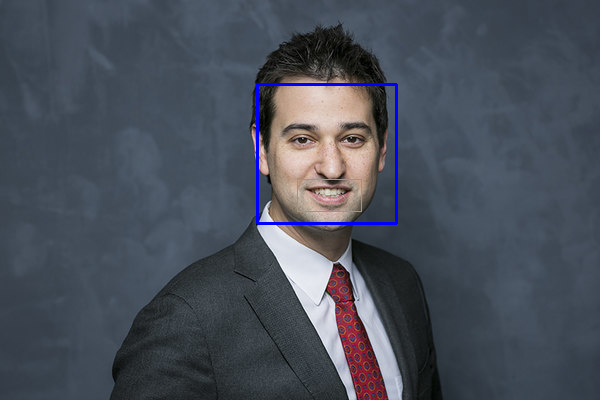

Murillo Campello


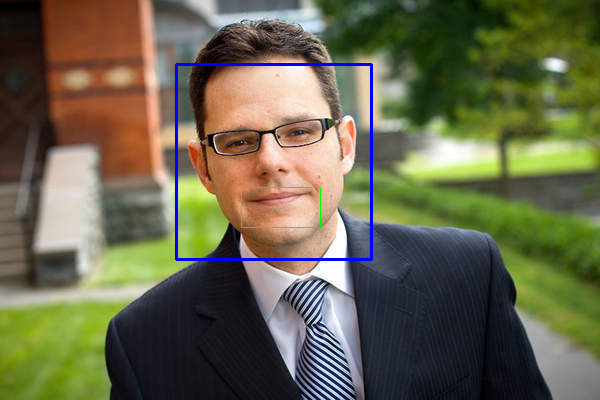

Will Cong


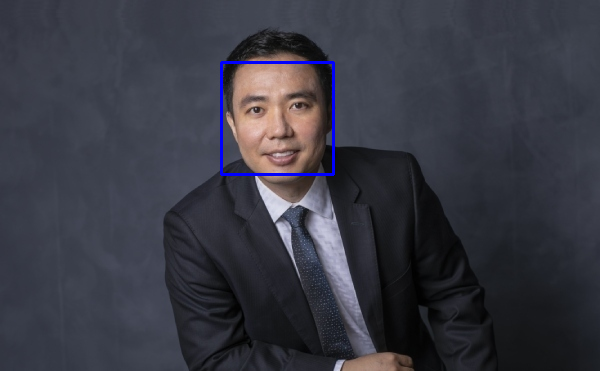

Adrian Aycan Corum


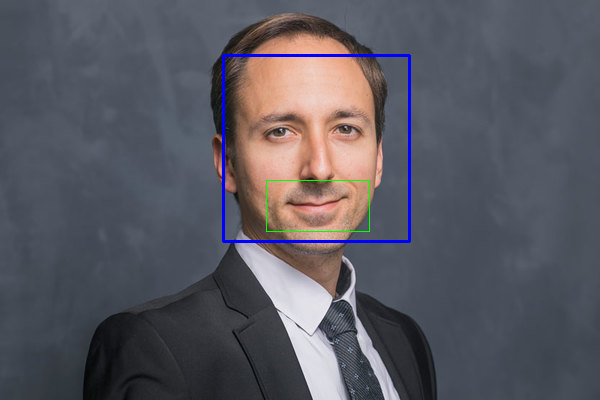

Ming Huang


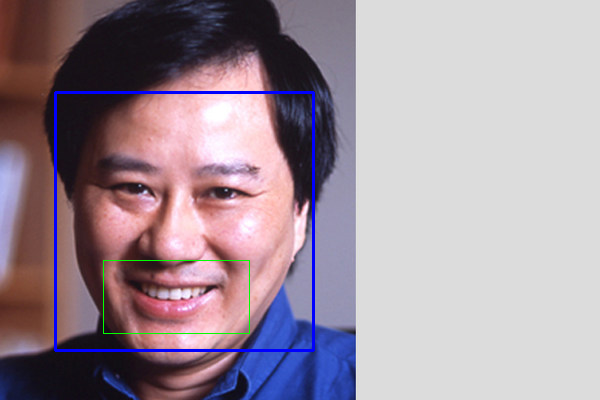

Robert A. Jarrow


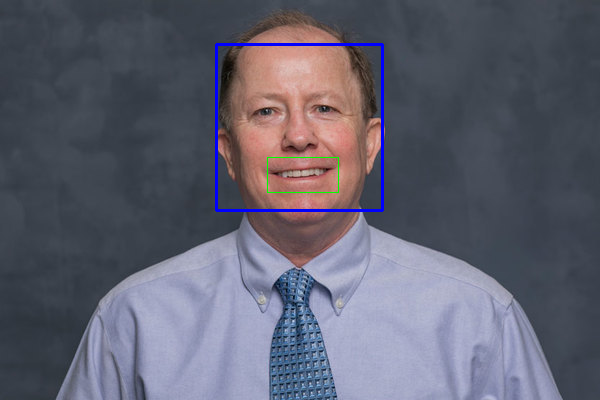

Andrew Karolyi


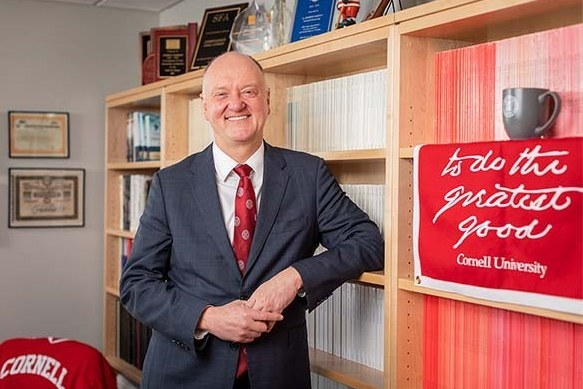

Maureen O’Hara


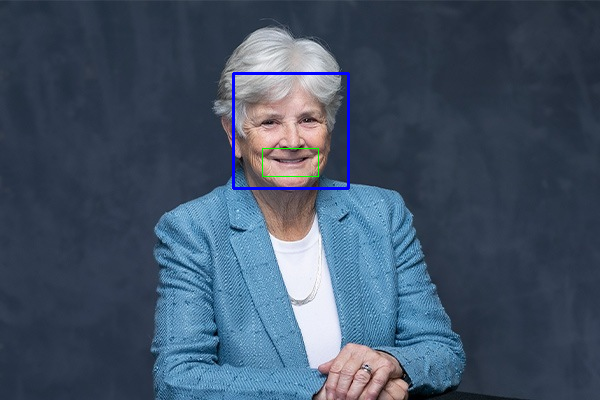

Gideon Saar


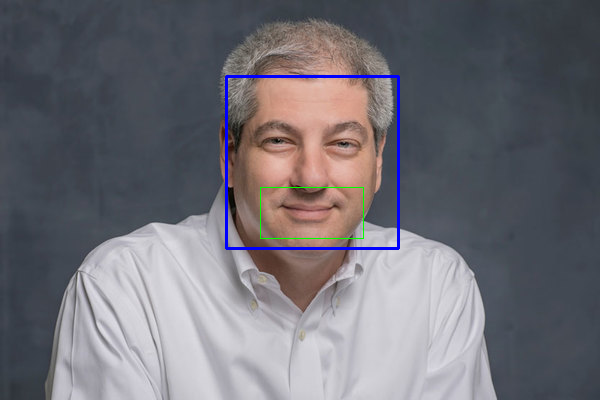

Gautam Ahuja


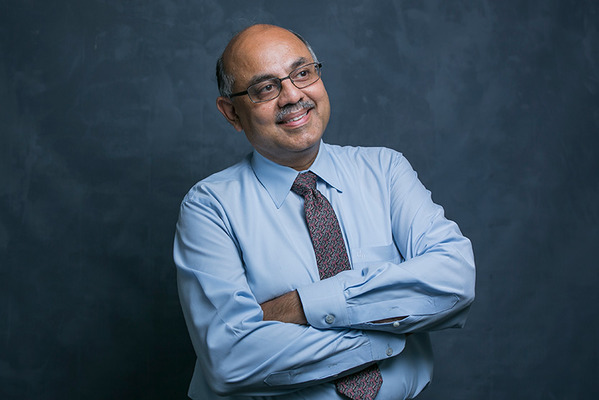

Ya-Ru Chen


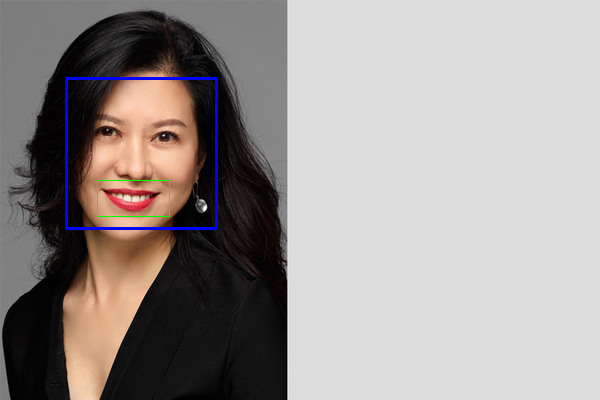

Glen W.S. Dowell


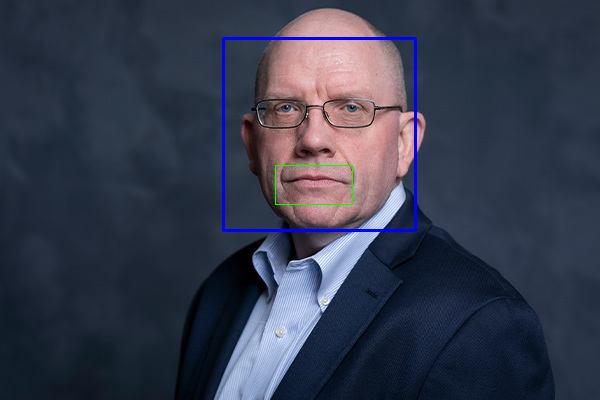

Michelle M. Duguid


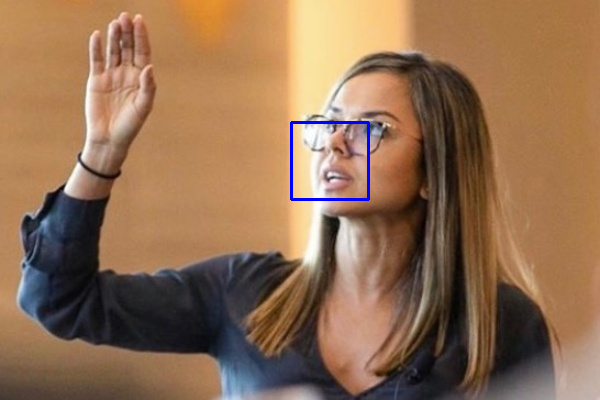

Angus Hildreth


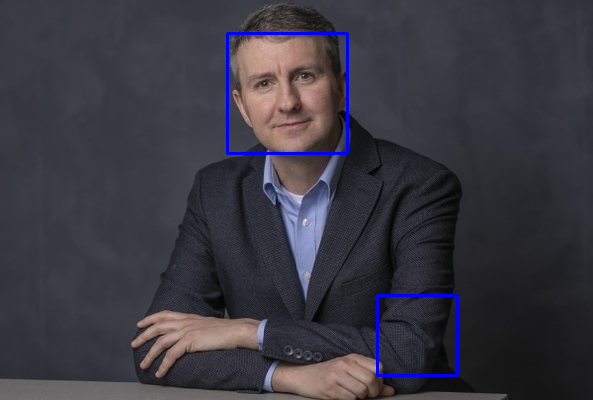

Elizabeth McClean


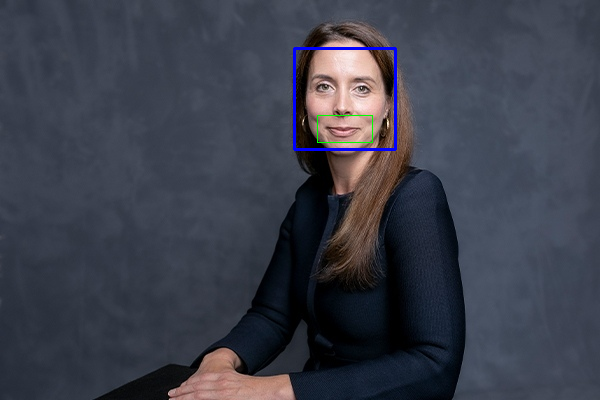

Elizabeth A. Mannix


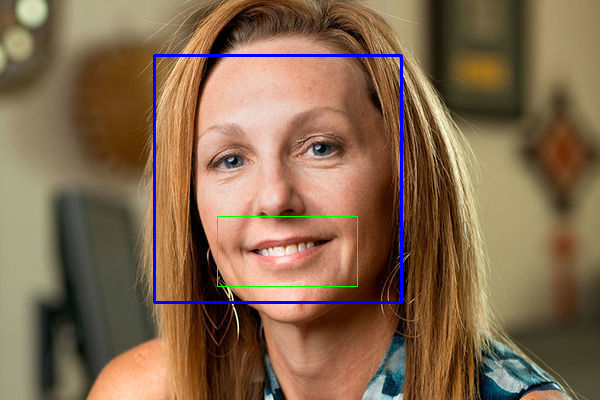

Matt Marx


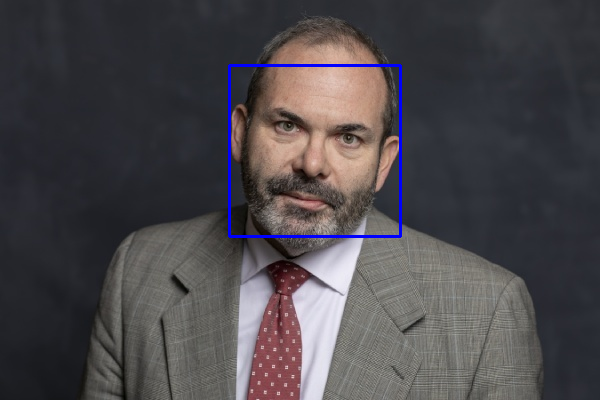

Sunita Sah


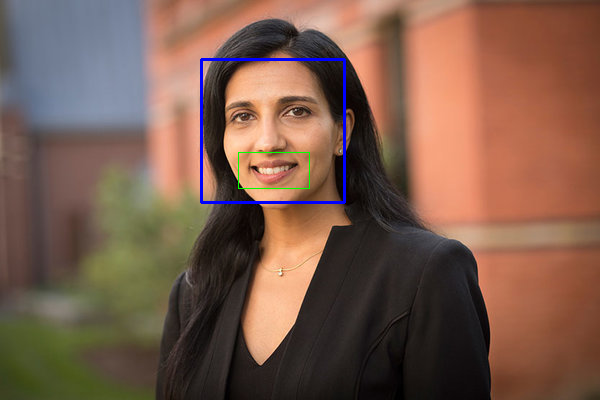

Wesley David Sine


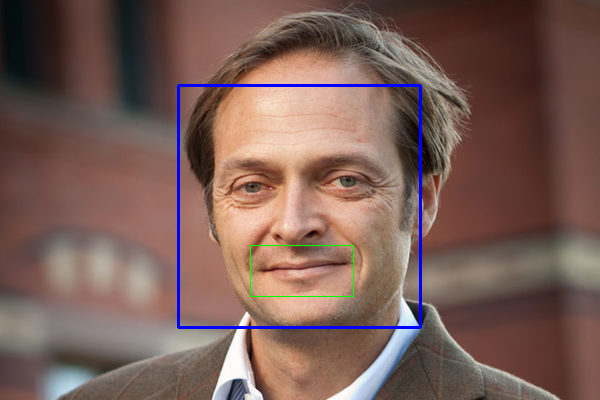

Tommaso Bondi


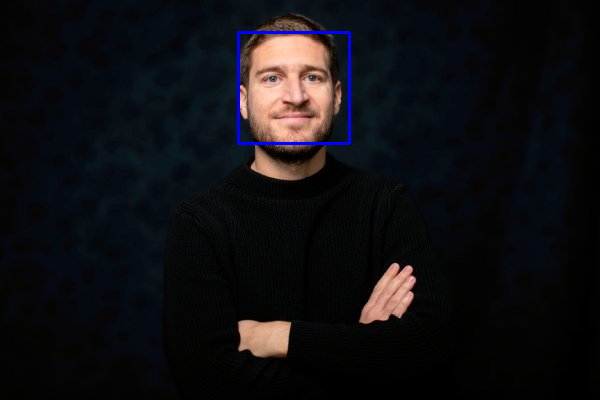

Khaled Boughanmi


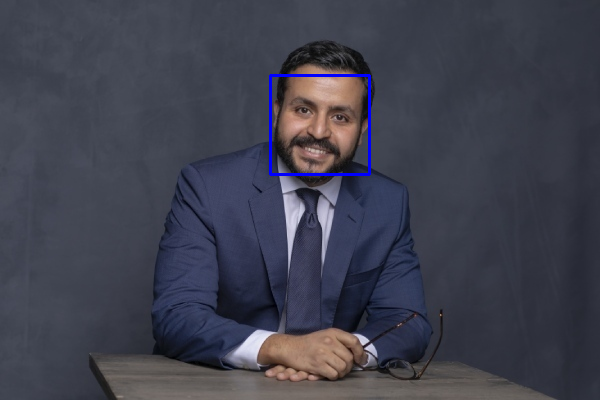

Emily Garbinsky


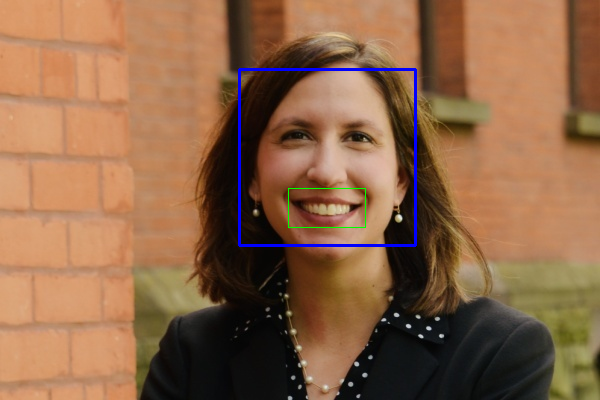

Sachin Gupta


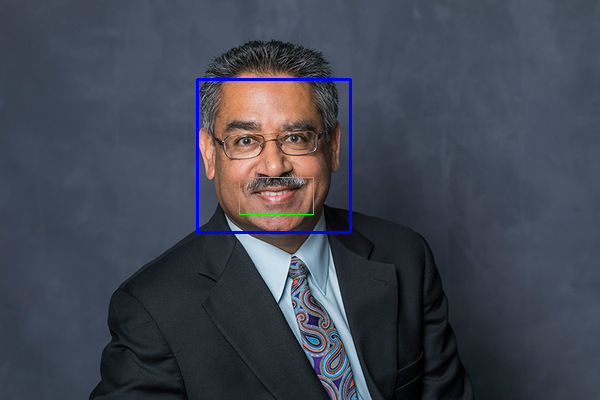

Vrinda Kadiyali


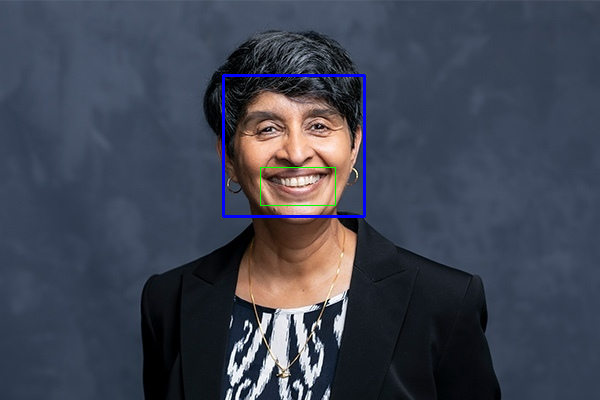

Young-Hoon Park


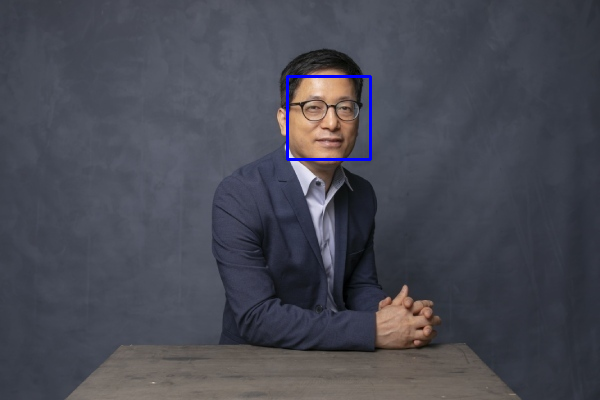

Omid Rafieian


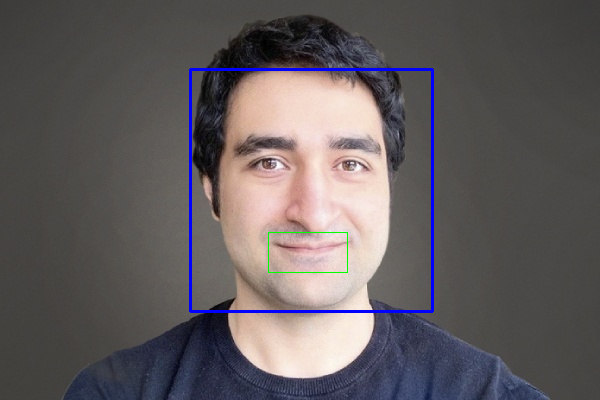

Douglas M. Stayman


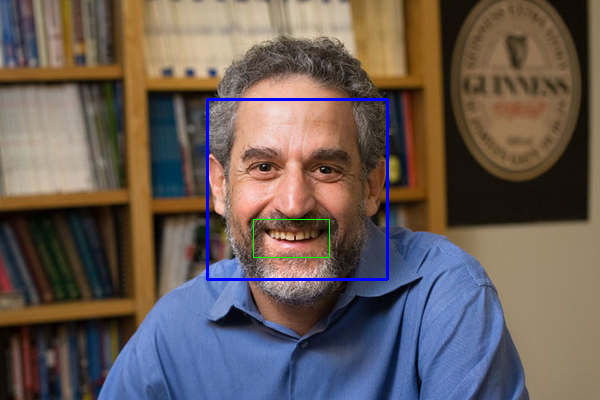

Manoj Thomas


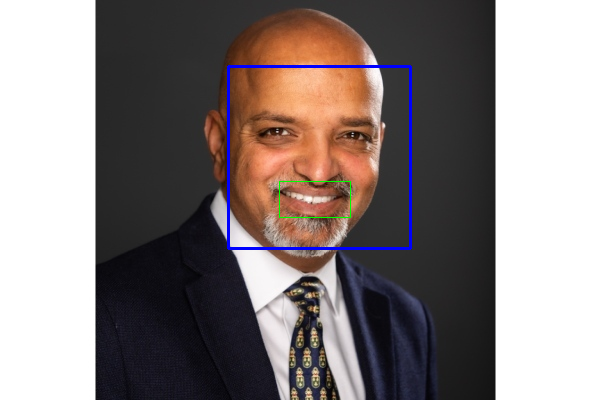

Stijn M.J. van Osselaer


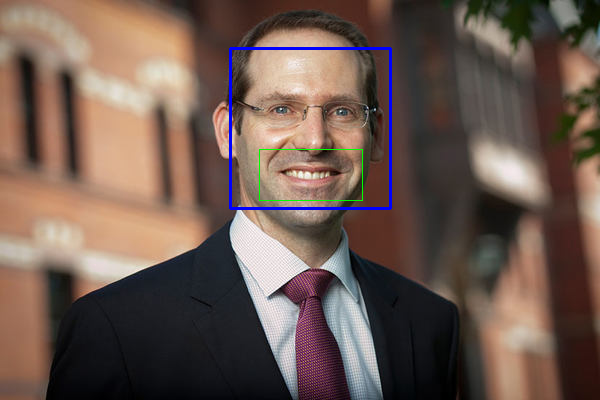

Kaitlin Woolley


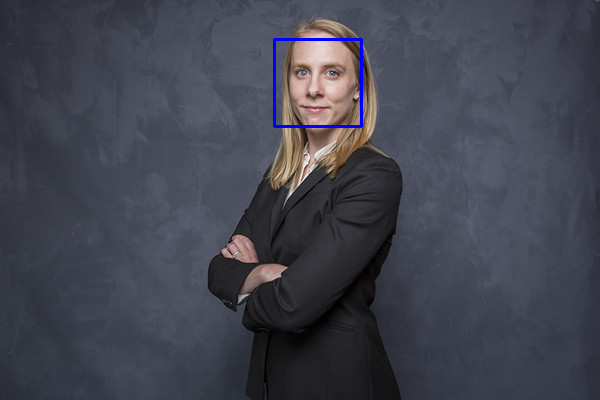

Arielle Anderer


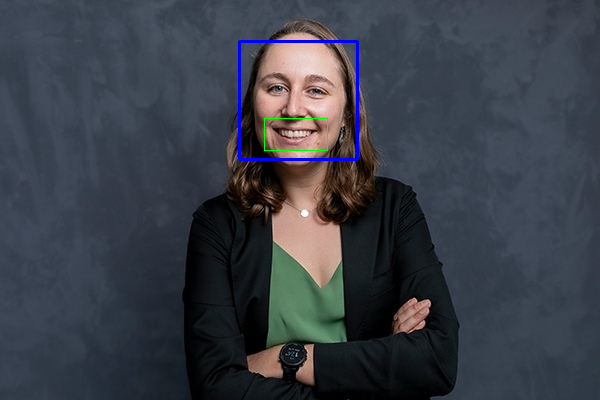

Li Chen


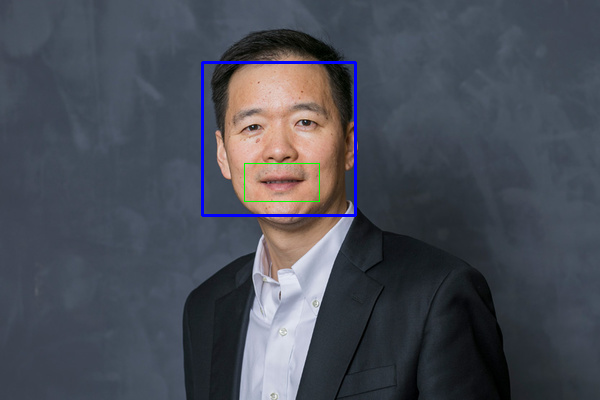

Yao Cui


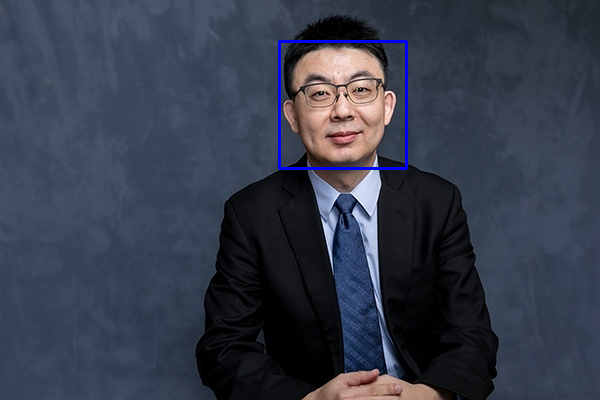

Andrew M. Davis


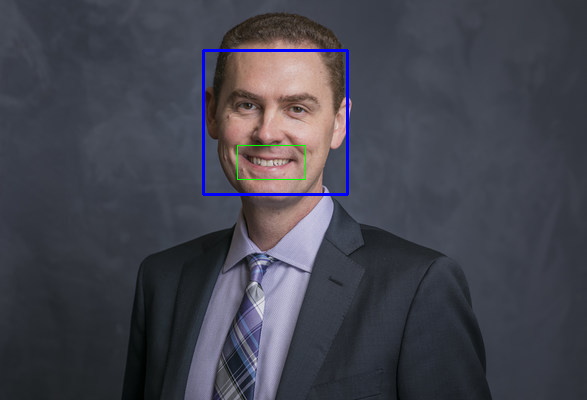

Vishal Gaur


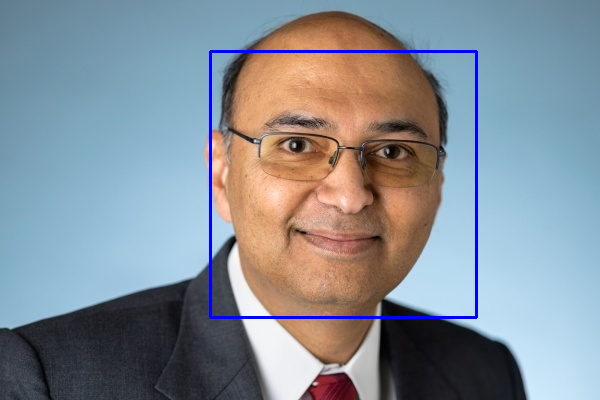

Karan Girotra


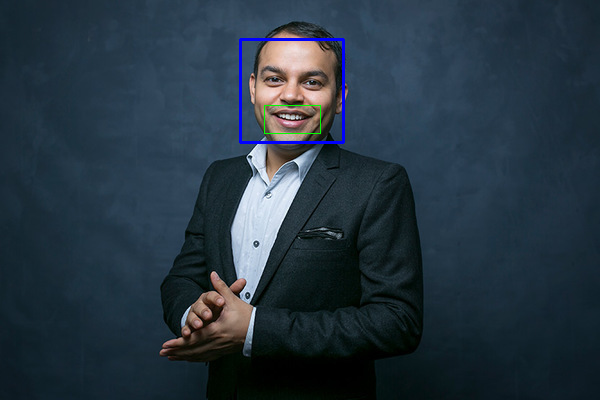

Yichun Hu


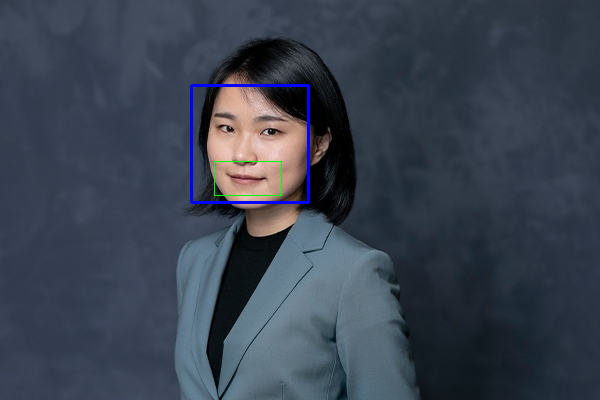

Nur Kaynar


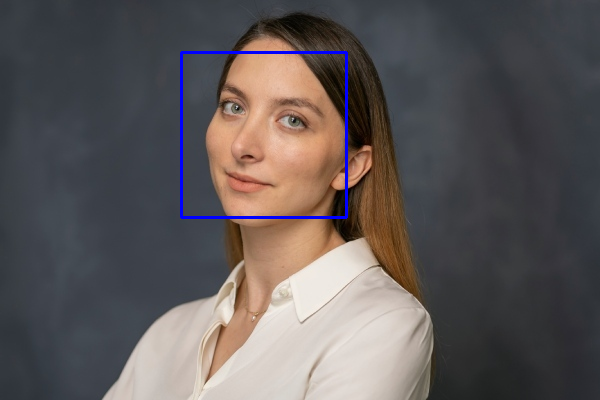

Yi Chen


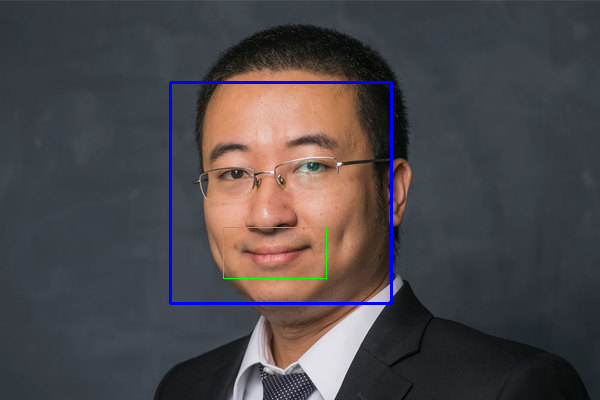

Ori Heffetz


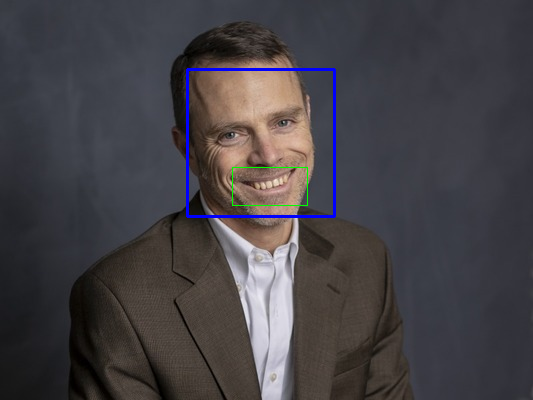

Justin P. Johnson


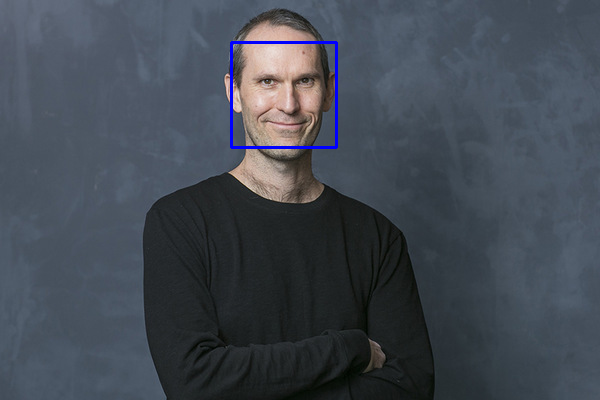

Thomas Jungbauer


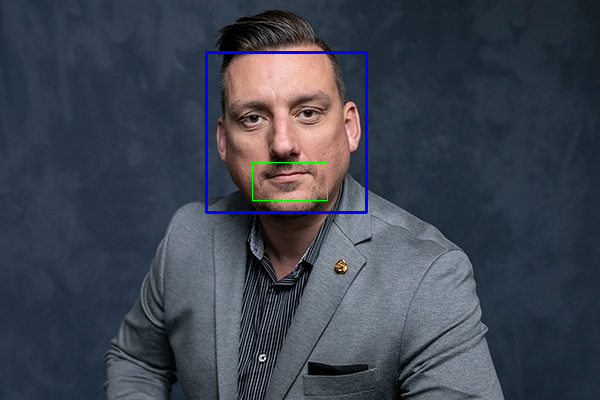

Marcel Preuss


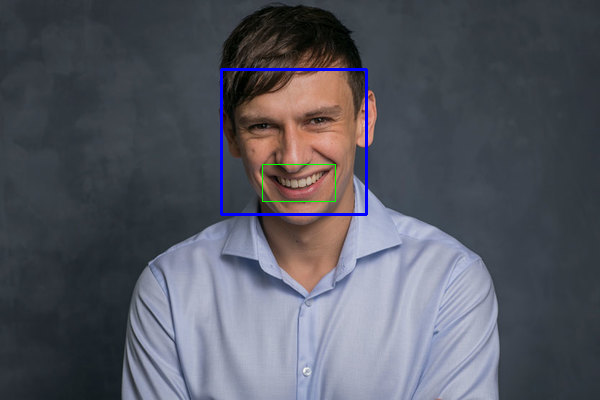

Michael Waldman


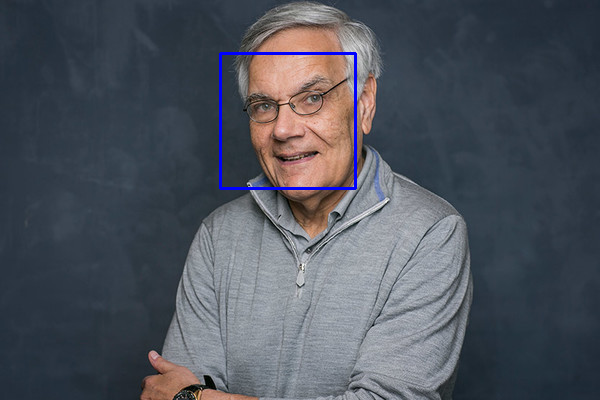

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')

names = []
face_detected = []
smile_detected = []
re_files = []

for index, row in df_2_J.iterrows():
    name = row["Name"]
    new_name = name.lower().replace(".", "").replace(" ", "_")
    filename = f"{new_name}.jpg"

    img = cv2.imread(f'/content/{filename}', -1)
    #faces = face_cascade.detectMultiScale(img)
    faces = face_cascade.detectMultiScale(img, scaleFactor=1.3, minNeighbors=5)

    if len(faces) > 0:
        face_var = 1
    else:
        face_var = 0

    for (x, y, w, h) in faces:
        # Draw rectangle around face
        cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
        roi_bottom_half = img[y + int(h * 0.6):y + h, x:x + w]

        # Check if the region of interest is not None
        if roi_bottom_half is not None:
            #smiles = smile_cascade.detectMultiScale(roi_bottom_half)
            smiles = smile_cascade.detectMultiScale(roi_bottom_half, scaleFactor=1.3, minNeighbors=30)

            if len(smiles) > 0:
                smile_var = 1
            else:
                smile_var = 0

            smile_coordinates = [(x + sx, y + int(h * 0.6) + sy, sw, sh) for (sx, sy, sw, sh) in smiles]
            # Calculate the bounding box for all smiles
            if smile_coordinates:
                min_x = min([x for (x, y, w, h) in smile_coordinates])
                min_y = min([y for (x, y, w, h) in smile_coordinates])
                max_w = max([x + w for (x, y, w, h) in smile_coordinates]) - min_x
                max_h = max([y + h for (x, y, w, h) in smile_coordinates]) - min_y

                # Draw a single larger rectangle around all smiles
                cv2.rectangle(img, (min_x, min_y), (min_x + max_w, min_y + max_h), (0, 255, 0), 1)

    face_detected.append(face_var)
    smile_detected.append(smile_var)
    names.append(name)

    save_filename = f'{new_name}_smile.jpg'
    re_files.append(save_filename)

    cv2.imwrite(save_filename, img)

    print(name)
    cv2_imshow(img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Gautam Ahuja (Tilted Head); Nur Kaynar(Tilted)
# Wrong recognition : Michelle M. Duguid

In [ ]:
df_smile = pd.DataFrame({"Name":names,
                         "Face":face_detected,
                         "Smile":smile_detected
                         })

df_smile.head()

print(df_smile["Face"].value_counts())
print(df_smile["Smile"].value_counts())

1    54
0     2
Name: Face, dtype: int64
1    41
0    15
Name: Smile, dtype: int64


In [ ]:
# Wrong Detection

df_smile.loc[df_smile["Name"] =="Michelle M. Duguid", "Face"] = 0

In [ ]:
re_files

# Save the file as a zipfile
import zipfile
import os

zip_filename = '2024_cornell_images_with_smile.zip'

with zipfile.ZipFile(zip_filename, 'w') as zipf:
  for filename in re_files:
    #print(filename)
    zipf.write(filename)

from google.colab import files
files.download('/content/2024_cornell_images_with_smile.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Final Touch

In [ ]:
df_result = df_2_J.merge(df_smile, on="Name")

df_result["University"] = "Cornell"

df_result = df_result[["University","Name","Department","Rank","Sex","Title","Pronouns","URL","Face","Smile"]]

df_result.head(3)

df_result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56 entries, 0 to 55
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   University  56 non-null     object
 1   Name        56 non-null     object
 2   Department  56 non-null     object
 3   Rank        56 non-null     object
 4   Sex         56 non-null     object
 5   Title       56 non-null     object
 6   Pronouns    56 non-null     object
 7   URL         56 non-null     object
 8   Face        56 non-null     int64 
 9   Smile       56 non-null     int64 
dtypes: int64(2), object(8)
memory usage: 4.8+ KB


In [ ]:
print(df_result["Rank"].value_counts(), "\n")
print(df_result["Sex"].value_counts(), "\n")
print(df_result["Face"].value_counts(), "\n")
print(df_result["Smile"].value_counts(), "\n")

Full         29
Assistant    18
Associate     9
Name: Rank, dtype: int64 

Male      42
Female    14
Name: Sex, dtype: int64 

1    53
0     3
Name: Face, dtype: int64 

1    41
0    15
Name: Smile, dtype: int64 



In [ ]:
df_result[df_result["Name"].str.contains("Michelle")]

,University,Name,Department,Rank,Sex,Title,Pronouns,URL,Face,Smile
24,Cornell,Michelle M. Duguid,management-and-organizations,Associate,Female,Associate Professor\nAssociate Dean of Diversi...,"[her, she]",https://www.johnson.cornell.edu/faculty-resear...,0,0


In [ ]:
df_result = df_result[df_result["Rank"] != "Emeritus"]
df_result = df_result[df_result["Sex"] != "Unknown"]
df_result = df_result[df_result["Face"] == 1]

df_result.to_csv("2024_01_Cornell_Smile.csv", index=False)
df_result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 55
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   University  53 non-null     object
 1   Name        53 non-null     object
 2   Department  53 non-null     object
 3   Rank        53 non-null     object
 4   Sex         53 non-null     object
 5   Title       53 non-null     object
 6   Pronouns    53 non-null     object
 7   URL         53 non-null     object
 8   Face        53 non-null     int64 
 9   Smile       53 non-null     int64 
dtypes: int64(2), object(8)
memory usage: 4.6+ KB


In [ ]:
df = df_result

from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df["Rank"], df['Smile'])
print(contingency_table, "\n")

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

Smile      0   1
Rank            
Assistant  5  13
Associate  2   6
Full       7  20 

Chi-square statistic: 0.028761362094695445
P-value: 0.9857222270595304
Degrees of freedom: 2
Expected frequencies:
[[ 4.75471698 13.24528302]
 [ 2.11320755  5.88679245]
 [ 7.13207547 19.86792453]]


In [ ]:
df = df_result

from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df["Sex"], df['Smile'])
print(contingency_table, "\n")

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

Smile    0   1
Sex           
Female   3  10
Male    11  29 

Chi-square statistic: 0.0
P-value: 1.0
Degrees of freedom: 1
Expected frequencies:
[[ 3.43396226  9.56603774]
 [10.56603774 29.43396226]]
